PART 1

In [1]:
import os
import re
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pickle
from scipy.optimize import least_squares

In [2]:
def load_image(path):
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Image at path {path} not found.")
    return img

def normalize_image_clahe(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    normalized_img = clahe.apply(img)
    return normalized_img

def undistort_image(img, camera_matrix, dist_coeffs):
    h, w = img.shape[:2]
    new_camera_matrix, _ = cv2.getOptimalNewCameraMatrix(camera_matrix, dist_coeffs, (w, h), 1, (w, h))
    undistorted_img = cv2.undistort(img, camera_matrix, dist_coeffs, None, new_camera_matrix)
    return undistorted_img



In [3]:
def detect_and_compute_sift(img, contrastThreshold=0.07, edgeThreshold=11, sigma=1.1):
    sift = cv2.SIFT_create(contrastThreshold=contrastThreshold, edgeThreshold=edgeThreshold, sigma=sigma)
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors


def draw_keypoints(img, keypoints):
    img_kp = cv2.drawKeypoints(img, keypoints, None, color=(0, 255, 0),
                               flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.imshow(img_kp, cmap='gray')
    plt.title('Keypoints')
    plt.show()



In [4]:
def display_normalized_images(image_paths, normalized_images, cols=3):
    """
    Display a list of normalized images in a grid.

    Parameters:
    - image_paths: list of original image paths for titles
    - normalized_images: list of normalized images
    - cols: number of columns for grid display (default is 3)
    """
    num_images = len(normalized_images)
    rows = (num_images // cols) + int(num_images % cols != 0)

    plt.figure(figsize=(15, 5 * rows))
    for i, (img, path) in enumerate(zip(normalized_images, image_paths)):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f'Normalized Image {i + 1}: {os.path.basename(path)}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [5]:
def match_features_flann(des1, des2, ratio=0.7):
    # FLANN parameters for SIFT
    index_params = dict(algorithm=1, trees=5)  # FLANN_INDEX_KDTREE = 1
    search_params = dict(checks=50)  # or adjust as needed
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Since SIFT descriptors are float, use knnMatch with k=2
    matches = flann.knnMatch(des1, des2, k=2,)
    
    # Apply Lowe's ratio test
    good_matches = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good_matches.append(m)
    return good_matches

def bidirectional_match(des1, des2, ratio=0.7):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches1 = bf.knnMatch(des1, des2, k=2)
    matches2 = bf.knnMatch(des2, des1, k=2)
    
    good_matches1 = [m for m, n in matches1 if m.distance < ratio * n.distance]
    good_matches2 = [m for m, n in matches2 if m.distance < ratio * n.distance]
    
    matches1_set = set((m.queryIdx, m.trainIdx) for m in good_matches1)
    matches2_set = set((m.trainIdx, m.queryIdx) for m in good_matches2)
    
    matches = [m for m in good_matches1 if (m.queryIdx, m.trainIdx) in matches2_set]
    return matches

def draw_matches(img1, kp1, img2, kp2, matches, inliers):
    # Draw only inlier matches
    inlier_matches = [m for m, inlier in zip(matches, inliers) if inlier]
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, inlier_matches, None,
                                  matchColor=(0, 255, 0),
                                  singlePointColor=None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(15, 10))
    plt.imshow(img_matches)
    plt.title('Inlier Matches')
    plt.show()



In [6]:
def residuals_homography(params, src_pts, dst_pts):
    # params: [h11, h12, h13, h21, h22, h23, h31, h32]
    H = np.array([
        [params[0], params[1], params[2]],
        [params[3], params[4], params[5]],
        [params[6], params[7], 1.0]
    ])
    
    src_pts_hom = np.hstack([src_pts, np.ones((src_pts.shape[0], 1))])  # (N,3)
    projected_pts = (H @ src_pts_hom.T).T  # (N,3)
    projected_pts /= projected_pts[:, [2]]  # Normalize
    
    residuals = (projected_pts[:, :2] - dst_pts).flatten()
    return residuals

def refine_homography_lm(initial_H, src_pts, dst_pts):
    initial_params = initial_H.flatten()[:8]  # Exclude the last element
    result = least_squares(residuals_homography, initial_params, method='lm', args=(src_pts, dst_pts))
    
    refined_params = result.x
    refined_H = np.array([
        [refined_params[0], refined_params[1], refined_params[2]],
        [refined_params[3], refined_params[4], refined_params[5]],
        [refined_params[6], refined_params[7], 1.0]
    ])
    return refined_H

def get_refined_homography(kp1, kp2, matches, inliers):
    if len(matches) < 4:
        raise ValueError("Not enough matches to compute homography.")
    
    # Extract inlier points
    src_pts = []
    dst_pts = []
    for match, inlier in zip(matches, inliers):
        if inlier:
            src_pts.append(kp1[match.queryIdx].pt)
            dst_pts.append(kp2[match.trainIdx].pt)
    
    src_pts = np.float32(src_pts).reshape(-1, 2)
    dst_pts = np.float32(dst_pts).reshape(-1, 2)
    
    if len(src_pts) < 4:
        raise ValueError("Not enough inlier matches to refine homography.")
    
    # Initial homography with the inliers
    initial_H, _ = cv2.findHomography(src_pts, dst_pts, 0)
    
    if initial_H is None:
        raise ValueError("Initial homography computation failed.")
    
    # Refine with Levenberg-Marquardt
    refined_H = refine_homography_lm(initial_H, src_pts, dst_pts)
    return refined_H


def get_homography_ransac(kp1, kp2, matches, ransac_thresh=4.7, max_iters=5000, confidence=0.995):
    if len(matches) < 4:
        raise ValueError("Not enough matches to compute homography.")
    
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    homography, mask = cv2.findHomography(
        src_pts, dst_pts, cv2.RANSAC, ransac_thresh,
        maxIters=max_iters, confidence=confidence
    )
    if homography is None:
        raise ValueError("Homography computation failed.")
    inliers = mask.ravel().tolist()
    
    return homography, inliers

# def get_affine_ransac(kp1, kp2, matches, ransac_thresh=4.0, max_iters=4000, confidence=0.995):
#     if len(matches) < 3:
#         raise ValueError("Not enough matches to compute affine transformation.")
    
#     src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
#     dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
#     affine_transform, inliers = cv2.estimateAffinePartial2D(
#         src_pts, dst_pts, method=cv2.RANSAC, ransacReprojThreshold=ransac_thresh,
#         maxIters=max_iters, confidence=confidence
#     )
#     if affine_transform is None:
#         raise ValueError("Affine transformation computation failed.")
    
#     return affine_transform, inliers.ravel().tolist()





In [7]:
def overlay_images(img1, img2, H):
    # Warp img1 to img2's perspective
    height, width = img2.shape
    warped_img1 = cv2.warpPerspective(img1, H, (width, height))
    
    # Create a simple overlay
    overlay = cv2.addWeighted(warped_img1, 0.5, img2, 0.5, 0)
    
    plt.figure(figsize=(10, 8))
    plt.imshow(overlay, cmap='gray')
    plt.title('Overlay of Aligned Images')
    plt.axis('off')
    plt.show()

def compute_reprojection_error(H, src_pts, dst_pts):
    src_pts_hom = np.hstack([src_pts, np.ones((src_pts.shape[0], 1))])  # (N,3)
    projected_pts = (H @ src_pts_hom.T).T  # (N,3)
    projected_pts /= projected_pts[:, [2]]
    
    errors = np.linalg.norm(projected_pts[:, :2] - dst_pts, axis=1)
    mean_error = np.mean(errors)
    return mean_error

In [8]:

def natural_sort(l):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)', key)]
    return sorted(l, key=alphanum_key)

def get_approx_camera_matrix(image_width, image_height):
    focal_length = max(image_width, image_height)  # A reasonable estimate
    center = (image_width / 2, image_height / 2)
    
    camera_matrix = np.array([[focal_length, 0, center[0]],
                              [0, focal_length, center[1]],
                              [0, 0, 1]], dtype=np.float32)
    
    dist_coeffs = np.zeros((4, 1))  # Assuming no distortion
    return camera_matrix, dist_coeffs



def create_mosaic(image_paths, homographies, alpha=0.7):
    images = [load_image(path) for path in image_paths]
    dimensions = [img.shape[::-1] for img in images]
    
    corners = []
    for img, H in zip(images, homographies):
        h, w = img.shape
        corner_pts = np.array([[0, 0], [w, 0], [w, h], [0, h]], dtype=np.float32).reshape(-1, 1, 2)
        warped_corners = cv2.perspectiveTransform(corner_pts, H)
        corners.append(warped_corners)

    all_corners = np.vstack(corners)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel() + 0.5)

    translation = [-xmin, -ymin]
    
    # Initialize mosaic and weight arrays
    mosaic = np.zeros((ymax - ymin, xmax - xmin), dtype=np.float32)
    weight = np.zeros((ymax - ymin, xmax - xmin), dtype=np.float32)

    for idx, (img, H) in enumerate(zip(images, homographies)):
        H_translation = H.copy()
        H_translation[0, 2] += translation[0]
        H_translation[1, 2] += translation[1]
    
        # Warp the current image
        warped_img = cv2.warpPerspective(img, H_translation, (xmax - xmin, ymax - ymin))
    
        # Create a mask for the warped image
        mask = (warped_img > 0).astype(np.float32)
    
        # Update the mosaic and weight
        mosaic += warped_img * mask
        weight += mask

    # Avoid division by zero
    weight[weight == 0] = 1e-10 

    # Normalize the mosaic
    mosaic /= weight

    plt.figure(figsize=(20, 10))
    plt.imshow(mosaic, cmap='gray')
    plt.title('Final Mosaic')
    plt.axis('off')
    plt.show()

    # Optionally, save the mosaic
    cv2.imwrite('mosaic_alpha_blending.png', mosaic)


def process_image_pair(img_path1, img_path2, camera_matrix, dist_coeffs, 
    visualize=True, bidirectional=False, sift_params=None, 
    match_ratio=0.7, ransac_params=None, image_paths=None):
    
    try:
        # Load and normalize images
        img1 = load_image(img_path1)
        img2 = load_image(img_path2)
        
        # Optionally apply distortion correction
        # img1 = undistort_image(img1, camera_matrix, dist_coeffs)
        # img2 = undistort_image(img2, camera_matrix, dist_coeffs)
    
        img1_norm = normalize_image_clahe(img1)
        img2_norm = normalize_image_clahe(img2)
        
        # Detect and compute features using SIFT
        if sift_params is None:
            sift_params = {}
        kp1, des1 = detect_and_compute_sift(img1_norm, **sift_params)
        kp2, des2 = detect_and_compute_sift(img2_norm, **sift_params)
        
        # Match features
        if bidirectional:
            matches = bidirectional_match(des1, des2, ratio=match_ratio)
        else:
            matches = match_features_flann(des1, des2, ratio=match_ratio)
        
        print(f"Total Matches: {len(matches)}")
        
        # Estimate homography with RANSAC
        if ransac_params is None:
            ransac_params = {'ransac_thresh': 8.0, 'max_iters': 5000, 'confidence': 0.995}
        try:
            homography, inliers = get_homography_ransac(kp1, kp2, matches, **ransac_params)
            print(f"Inliers: {sum(inliers)} / {len(matches)}")
        except ValueError as e:
            print(f"Homography estimation failed: {e}")
            return None
        
        # Refine homography with Levenberg-Marquardt
        refined_H = get_refined_homography(kp1, kp2, matches, inliers)
        
        # Compute reprojection error
        src_pts = []
        dst_pts = []
        for match, inlier in zip(matches, inliers):
            if inlier:
                src_pts.append(kp1[match.queryIdx].pt)
                dst_pts.append(kp2[match.trainIdx].pt)
        
        src_pts = np.float32(src_pts).reshape(-1, 2)
        dst_pts = np.float32(dst_pts).reshape(-1, 2)
        error = compute_reprojection_error(refined_H, src_pts, dst_pts)
        print(f"Mean Reprojection Error: {error:.2f} pixels")
        
        if visualize:
            # Draw matches
            draw_matches(img1_norm, kp1, img2_norm, kp2, matches, inliers)
            
            # Create and display the mosaic of the current pair
            pair_paths = [img_path1, img_path2]
            pair_homographies = [np.eye(3), np.linalg.inv(refined_H)]
            print("\n--- Creating Mosaic for the Image Pair ---")
            create_mosaic(pair_paths, pair_homographies)
        
        return refined_H, matches, inliers, kp1, kp2

    except Exception as e:
        print(f"Error processing pair ({img_path1, img_path2}): {e}")
        return None


Displaying all normalized images...


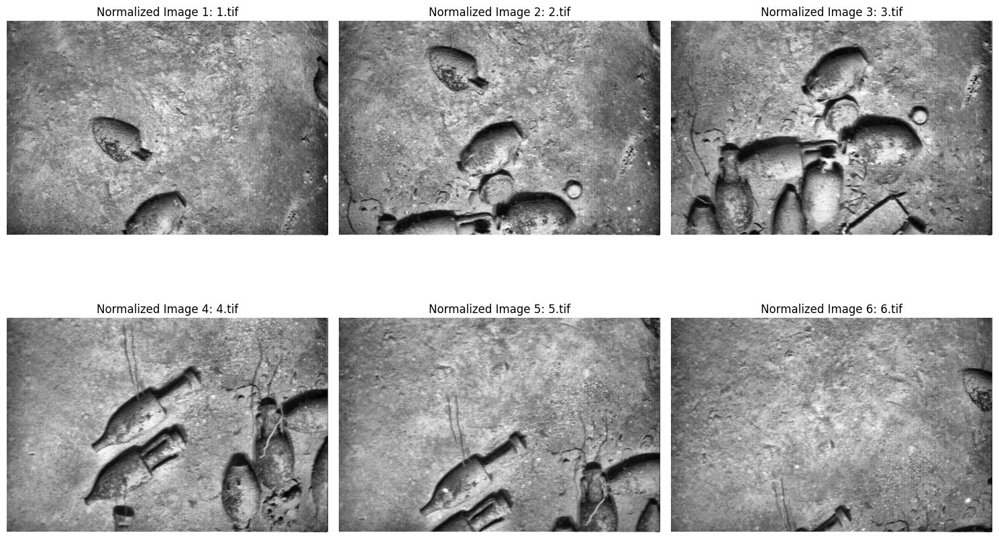


Processing Sequential Pair: Image 0 and Image 1
Total Matches: 150
Inliers: 126 / 150
Mean Reprojection Error: 1.90 pixels


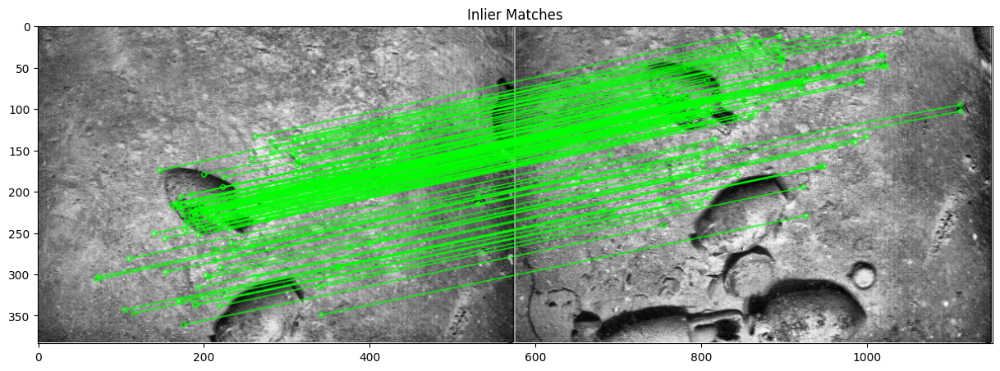


--- Creating Mosaic for the Image Pair ---


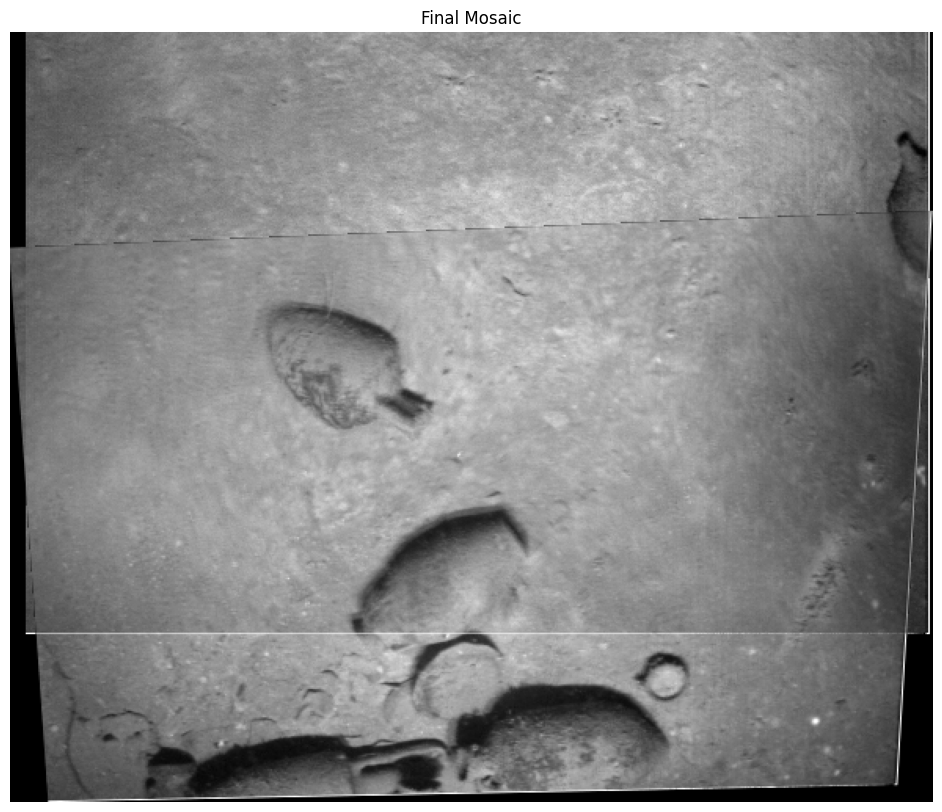


Processing Sequential Pair: Image 1 and Image 2
Total Matches: 125
Inliers: 104 / 125
Mean Reprojection Error: 2.66 pixels


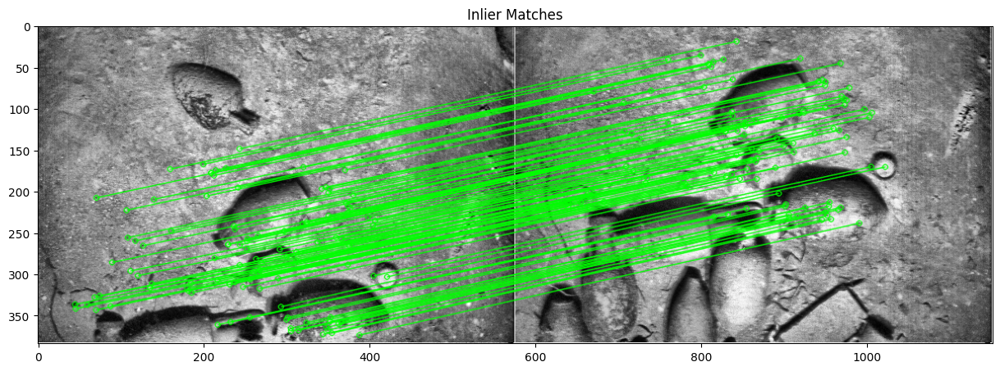


--- Creating Mosaic for the Image Pair ---


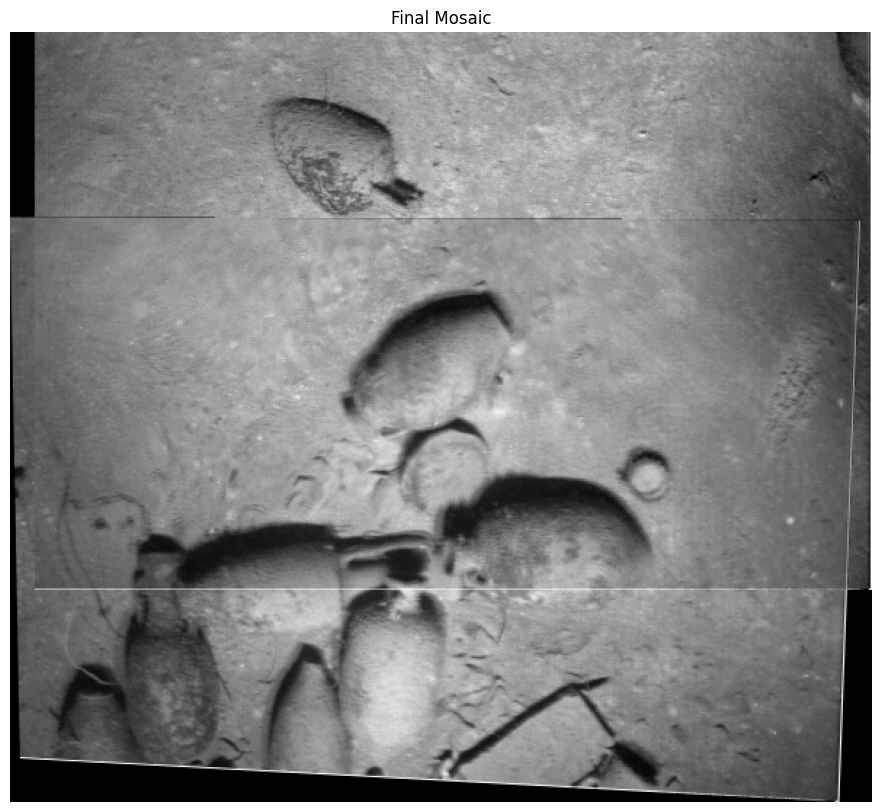


Processing Sequential Pair: Image 2 and Image 3
Total Matches: 11
Inliers: 8 / 11
Mean Reprojection Error: 0.29 pixels


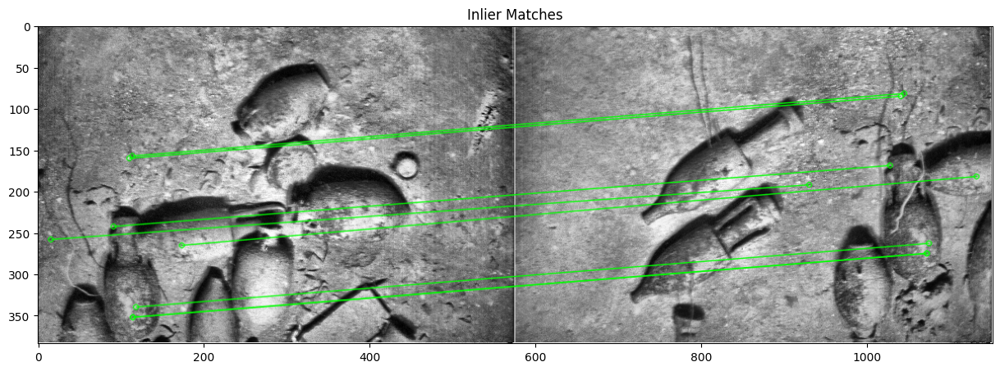


--- Creating Mosaic for the Image Pair ---


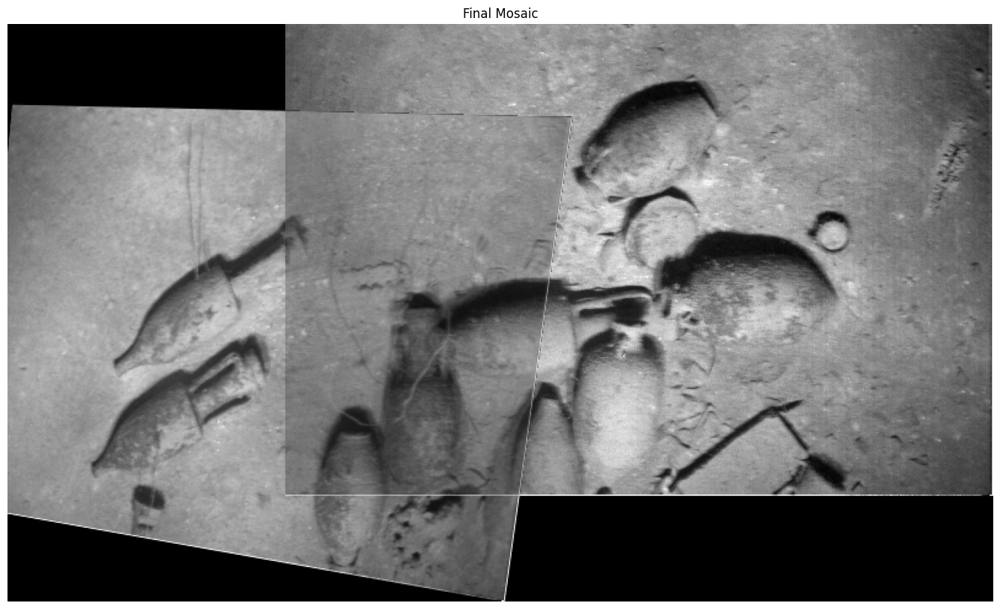


Processing Sequential Pair: Image 3 and Image 4
Total Matches: 117
Inliers: 102 / 117
Mean Reprojection Error: 1.58 pixels


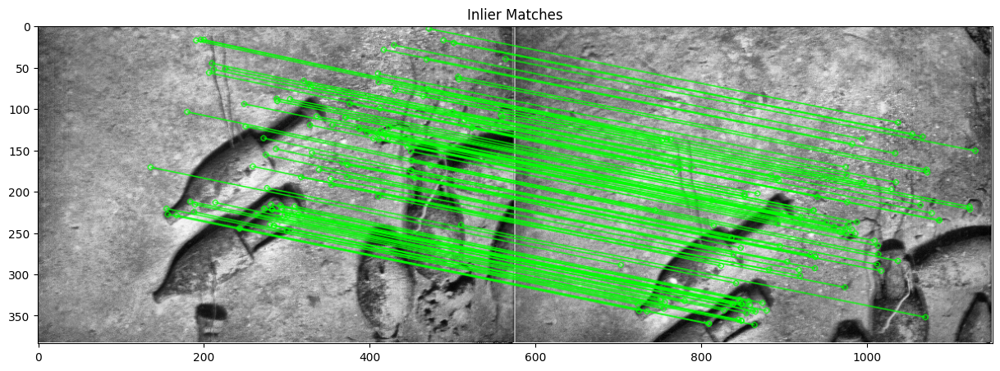


--- Creating Mosaic for the Image Pair ---


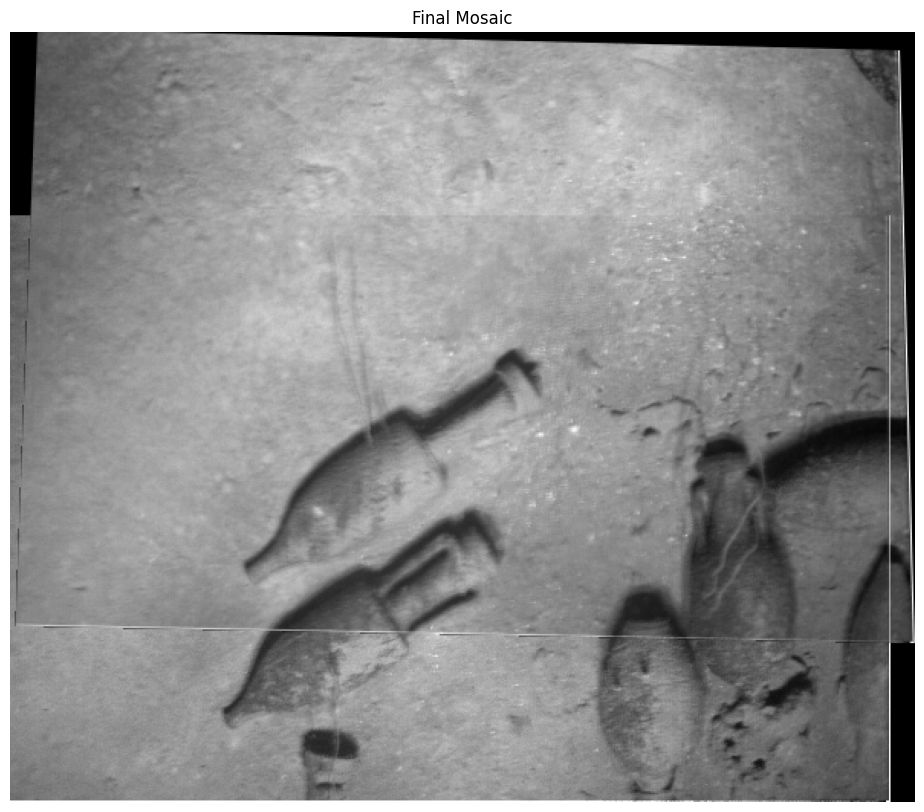


Processing Sequential Pair: Image 4 and Image 5
Total Matches: 68
Inliers: 64 / 68
Mean Reprojection Error: 1.45 pixels


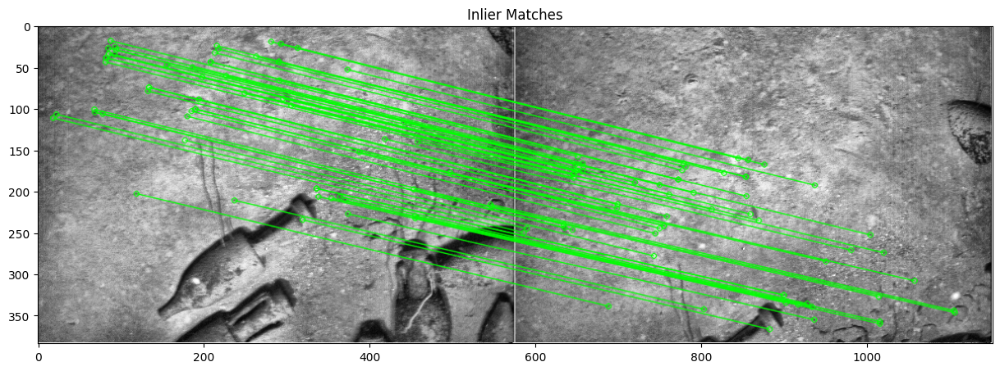


--- Creating Mosaic for the Image Pair ---


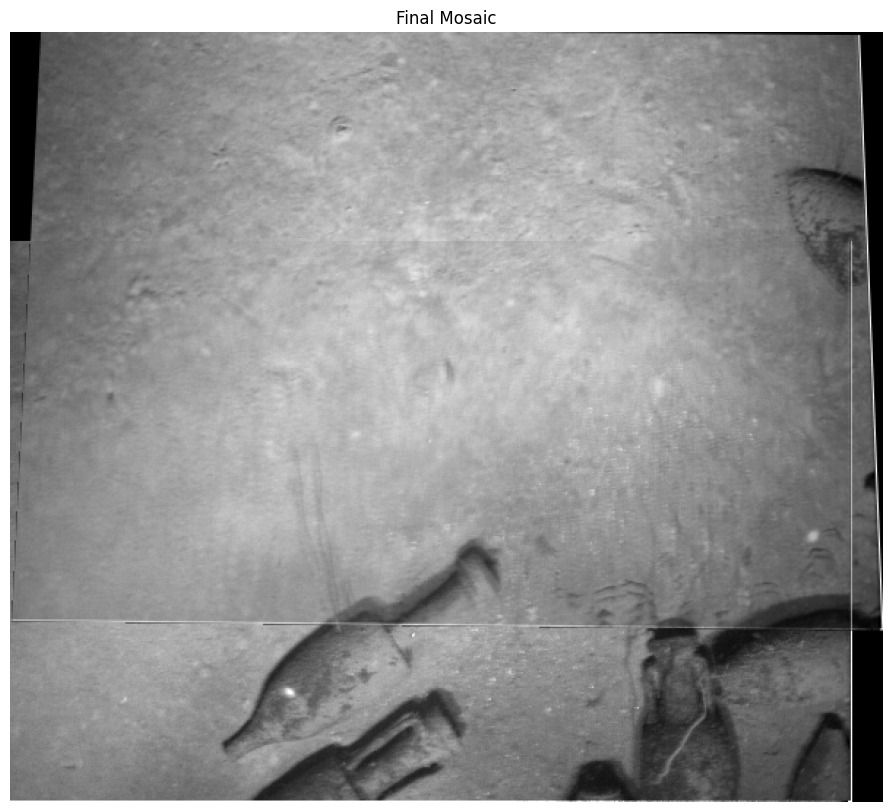


Processing Non-Sequential Pair: Image 0 and Image 5
Total Matches: 12
Inliers: 12 / 12
Mean Reprojection Error: 0.93 pixels


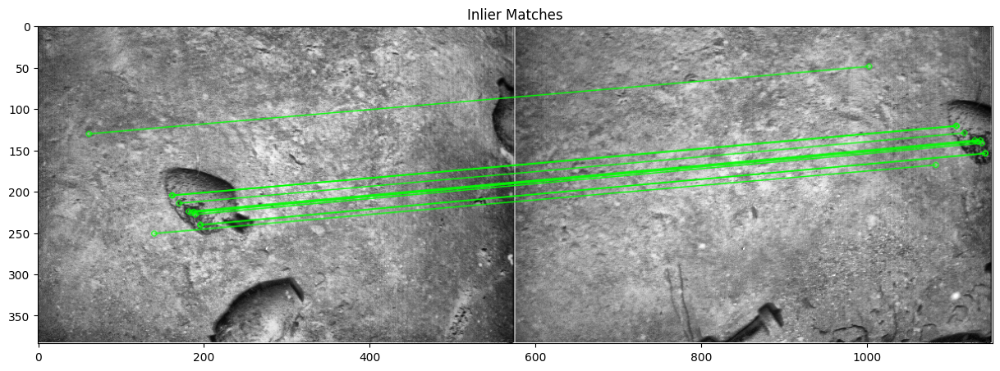


--- Creating Mosaic for the Image Pair ---


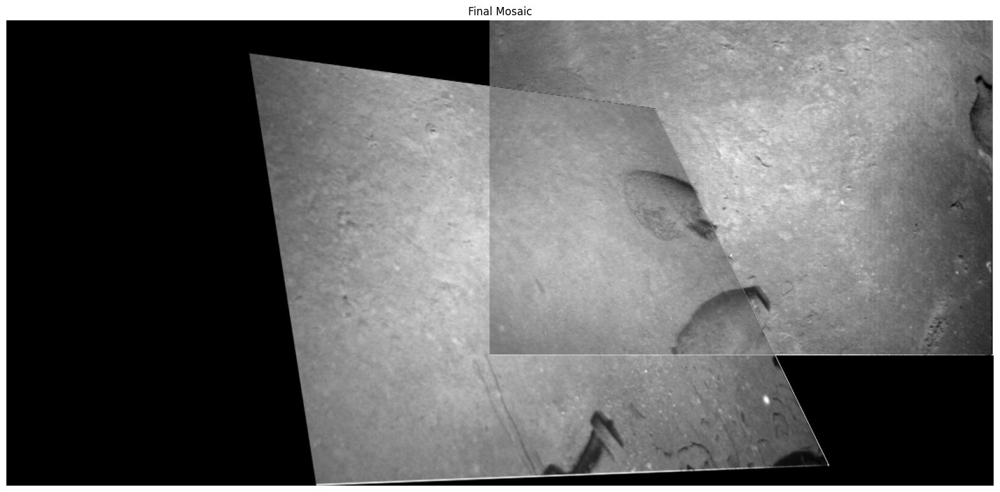

Non-sequential pair 0 and 5: Matches = 12, Reprojection error = 0.93

Processing Non-Sequential Pair: Image 1 and Image 4
Total Matches: 7
Inliers: 5 / 7
Mean Reprojection Error: 0.92 pixels


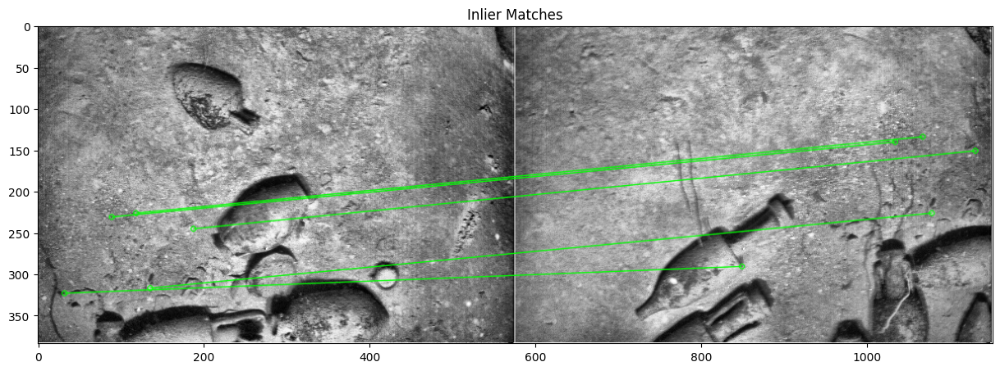


--- Creating Mosaic for the Image Pair ---


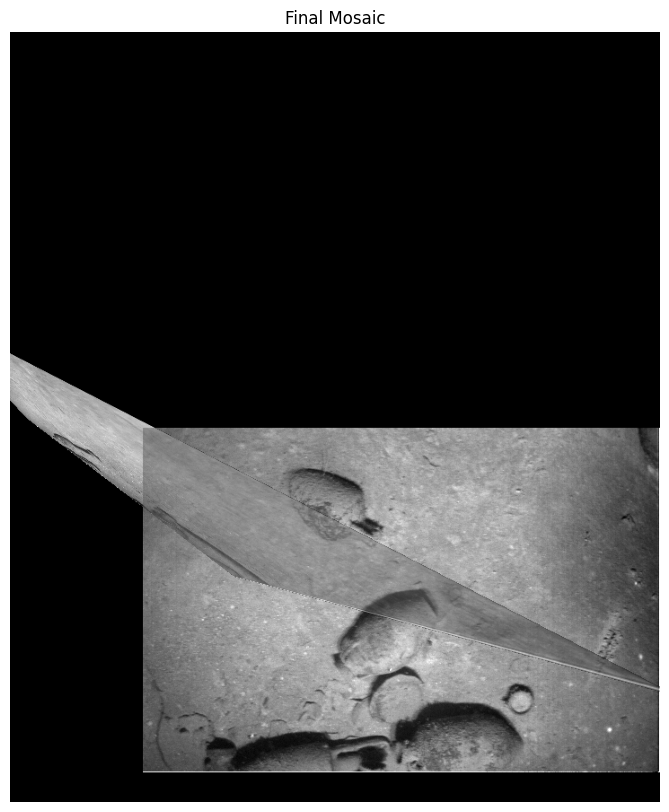

Non-sequential pair 1 and 4: Matches = 7, Reprojection error = 60.22

Processing Non-Sequential Pair: Image 1 and Image 3
Total Matches: 5
Inliers: 4 / 5
Mean Reprojection Error: 0.00 pixels


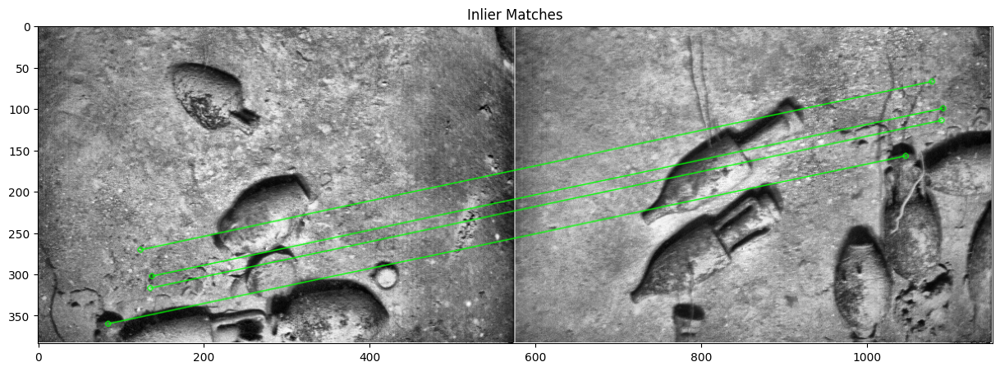


--- Creating Mosaic for the Image Pair ---


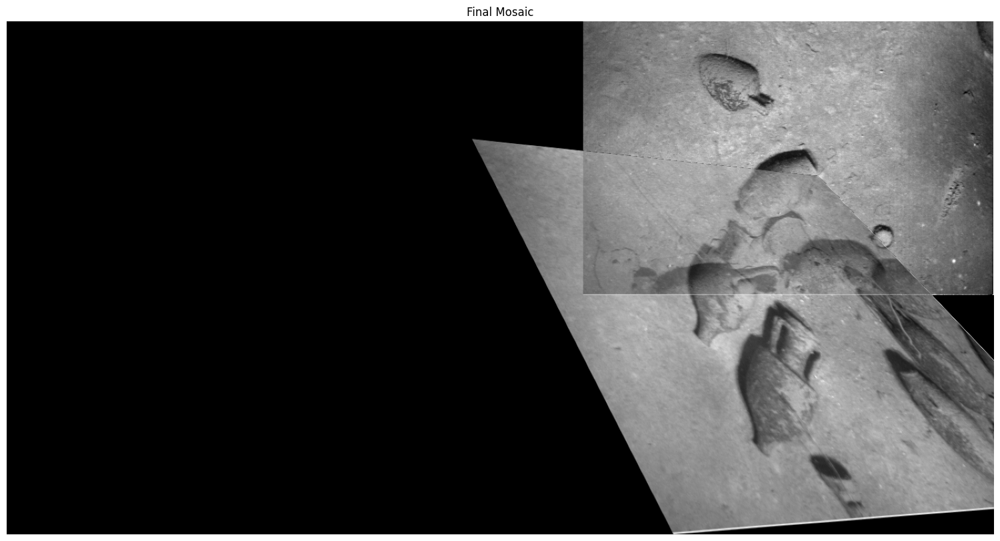

Non-sequential pair 1 and 3: Matches = 5, Reprojection error = 110.49

Processing Non-Sequential Pair: Image 2 and Image 4
Total Matches: 7
Inliers: 6 / 7
Mean Reprojection Error: 0.45 pixels


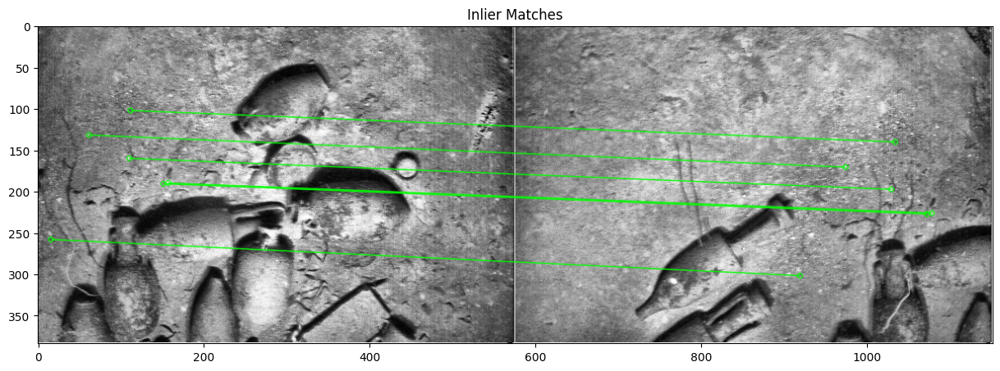


--- Creating Mosaic for the Image Pair ---


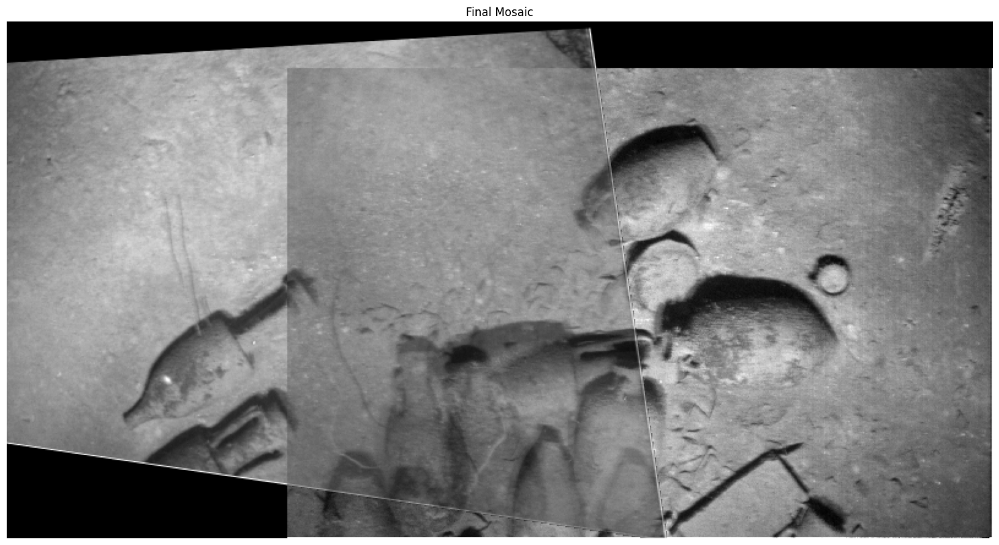

Non-sequential pair 2 and 4: Matches = 7, Reprojection error = 34.07

--- Creating Mosaic ---


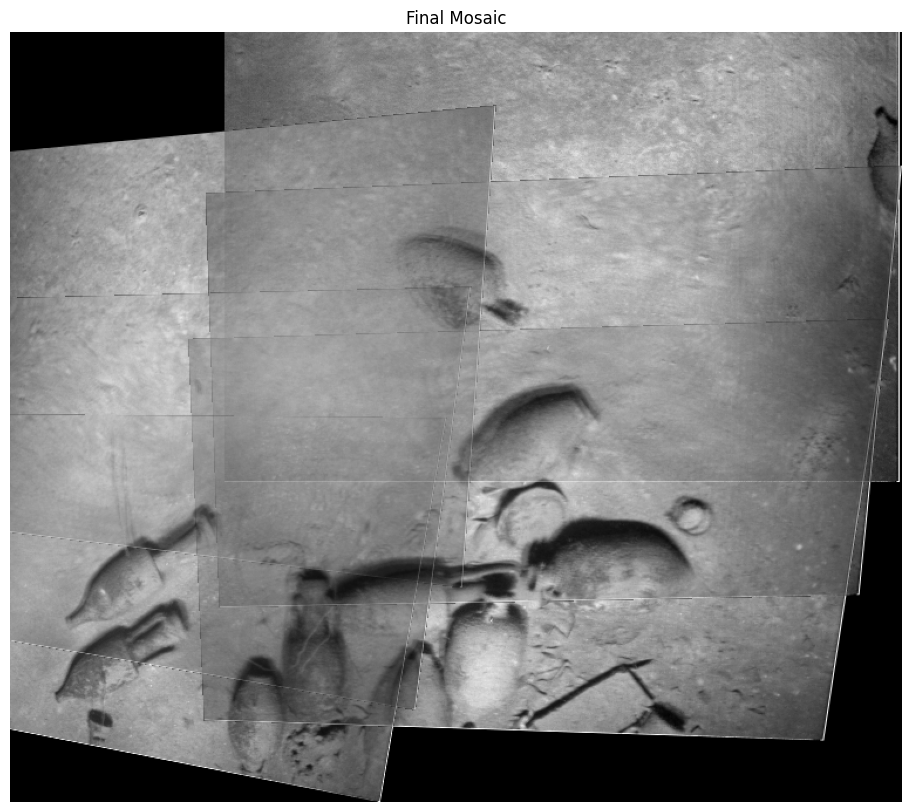

In [9]:
#main() function
def main():
    image_folder = '6Images'  # Update this path accordingly
    image_names = natural_sort(os.listdir(image_folder))  # Ensure correct ordering
    image_paths = [os.path.join(image_folder, name) for name in image_names[:6]]  # First 6 images

    # Get the dimensions of the first image
    sample_image = load_image(image_paths[0])
    image_height, image_width = sample_image.shape[:2]

    # Get approximate camera matrix and distortion coefficients
    camera_matrix, dist_coeffs = get_approx_camera_matrix(image_width, image_height)

    num_images = len(image_paths)
    homographies = [np.eye(3)]  # Homography for the reference image is identity
    
    homography_dict = {}  # To store homographies between image pairs
    matches_dict = {}
    inliers_dict = {}
    
    # Normalize images
    normalized_images = [normalize_image_clahe(load_image(path)) for path in image_paths]
    
    # Display all normalized images
    print("\nDisplaying all normalized images...")
    display_normalized_images(image_paths, normalized_images)
    
    # Process sequential pairs
    for i in range(num_images - 1):
        print(f"\nProcessing Sequential Pair: Image {i} and Image {i+1}")
        result = process_image_pair(image_paths[i], image_paths[i+1], camera_matrix, dist_coeffs, bidirectional=True)
        if result is not None:
            H, matches_serializable, inliers, kp1, kp2 = result
            homographies.append(homographies[i] @ np.linalg.inv(H))
            # Store homographies and matches
            homography_dict[(i, i+1)] = H
            matches_dict[(i, i+1)] = matches_serializable
            inliers_dict[(i, i+1)] = inliers
        else:
            homographies.append(homographies[i])

    # Process non-sequential pairs
    non_sequential_pairs = [(0, 5), (1, 4), (1, 3), (2, 4)]
    
    for i, j in non_sequential_pairs:
        print(f"\nProcessing Non-Sequential Pair: Image {i} and Image {j}")
        result = process_image_pair(image_paths[i], image_paths[j], camera_matrix, dist_coeffs, bidirectional=True)
        if result is not None:
            H, matches_serializable, inliers, kp1, kp2 = result
            homography_dict[(i, j)] = H
            matches_dict[(i, j)] = matches_serializable
            inliers_dict[(i, j)] = inliers

            # Compute and print mean reprojection error for loop closure
            src_pts = [kp1[m.queryIdx].pt for m in matches_serializable]
            dst_pts = [kp2[m.trainIdx].pt for m in matches_serializable]
            error = compute_reprojection_error(H, np.float32(src_pts), np.float32(dst_pts))
            print(f"Non-sequential pair {i} and {j}: Matches = {len(matches_serializable)}, Reprojection error = {error:.2f}")
        else:
            print(f"Failed to compute homography between images {i} and {j}")

    # Create Mosaic
    print("\n--- Creating Mosaic ---")
    create_mosaic(image_paths, homographies)

if __name__ == "__main__":
    main()
